In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/football-player-segmentation/annotations/instances_default.json
/kaggle/input/football-player-segmentation/images/208.jpg
/kaggle/input/football-player-segmentation/images/473.jpg
/kaggle/input/football-player-segmentation/images/333.jpg
/kaggle/input/football-player-segmentation/images/45.jpg
/kaggle/input/football-player-segmentation/images/369.jpg
/kaggle/input/football-player-segmentation/images/56.jpg
/kaggle/input/football-player-segmentation/images/89.jpg
/kaggle/input/football-player-segmentation/images/20.jpg
/kaggle/input/football-player-segmentation/images/275.jpg
/kaggle/input/football-player-segmentation/images/212.jpg
/kaggle/input/football-player-segmentation/images/239.jpg
/kaggle/input/football-player-segmentation/images/58.jpg
/kaggle/input/football-player-segmentation/images/150.jpg
/kaggle/input/football-player-segmentation/images/6.jpg
/kaggle/input/football-player-segmentation/images/109.jpg
/kaggle/input/football-player-segmentation/images/149.jpg
/

In [2]:
!wget --quiet https://raw.githubusercontent.com/pytorch/vision/release/0.12/references/detection/engine.py
!wget --quiet https://raw.githubusercontent.com/pytorch/vision/release/0.12/references/detection/utils.py
!wget --quiet https://raw.githubusercontent.com/pytorch/vision/release/0.12/references/detection/transforms.py
!wget --quiet https://raw.githubusercontent.com/pytorch/vision/release/0.12/references/detection/coco_eval.py
!wget --quiet https://raw.githubusercontent.com/pytorch/vision/release/0.12/references/detection/coco_utils.py
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

In [3]:
# !wget --quiet https://github.com/sizhky/torch_snippets.git
!pip install torch_snippets
from torch_snippets import *
from torch_snippets.inspector import inspect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 882.3 kB/s eta 0:00:00 0:00:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.3/90.3 kB 1.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.3/204.3 kB 3.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 23.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.8/15.8 MB 52.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.0/99.0 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 67.7 MB/s eta 0:00:00:00:01
  Created wheel for typing: filename=typing-3.7.4.3-py3-none-any.whl size=26304 sha256=052c2ef2572a4f4aa32229a4286302dcc4085a5b6b40d5b26f93aa7b1495368a
  Stored in directory: /root/.cache/pip/wheels/7c/d0/9e/1f26ebb66d9e1732e4098bc5a6c2d91f6c9a529838f0284890
Successfully buil

In [4]:
# этот блок устраняет ошибку версии numpy, которая вылетала в процессе обучения
# в colab нужно просто понизить версию numpy путем: 
# !pip install --force-reinstall numpy==1.23 # понижение версии чтобы не было ошибки np.float
from packaging import version
import numpy as np

if version.parse(np.__version__) >= version.parse("1.24.0"):
    np.float = np.float32

In [5]:
!pip install pycocotools
!pip show pycocotools
import pycocotools

Name: pycocotools
Version: 2.0
Summary: 
Home-page: 
Author: 
Author-email: 
License: 
Location: /opt/conda/lib/python3.10/site-packages
Requires: cython, matplotlib, setuptools
Required-by: 


In [6]:
# from torch_snippets import *
from IPython import display
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchinfo import summary
import torch
from PIL import Image, ImageDraw
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T, models, datasets
from xml.etree import ElementTree as et
import torchvision
import glob
import cv2
import pandas as pd
# import numpy as np
import matplotlib.patches as patches
import tqdm
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
%matplotlib inline

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [7]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

from engine import train_one_epoch, evaluate
import utils
import transforms as T


In [8]:
# Поразбираться
# from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator

# **0. Загрузка данных**

In [8]:
pics = glob.glob('/kaggle/input/football-player-segmentation/images/*')
anns = '/kaggle/input/football-player-segmentation/annotations/instances_default.json'

In [9]:
# загружаем json
import json
with open(anns) as json_file:
    data = json.load(json_file)

In [10]:
# смотрим ключики
for key, value in data.items() :
    print (key)#, value

licenses
info
categories
images
annotations


In [11]:
# смотрим количество картинок
len(data['images'])

512

In [16]:
# смотрим содержание данных для картинок
data['images'][1]

{'id': 2,
 'width': 1920,
 'height': 1080,
 'file_name': '1.jpg',
 'license': 0,
 'flickr_url': '',
 'coco_url': '',
 'date_captured': 0}

In [17]:
print(data['annotations'][22])

{'id': 23, 'image_id': 2, 'category_id': 1, 'segmentation': [[16.16, 973.58, 14.36, 977.67, 14.36, 982.47, 14.36, 987.08, 15.46, 992.17, 16.96, 997.87, 18.46, 1003.37, 19.86, 1006.78, 20.16, 1008.47, 19.76, 1009.78, 18.26, 1009.28, 17.36, 1010.08, 16.86, 1012.37, 17.66, 1015.37, 20.16, 1016.97, 23.96, 1018.47, 27.36, 1019.08, 28.96, 1017.17, 29.36, 1015.08, 29.76, 1012.17, 30.16, 1009.67, 28.86, 1007.58, 27.96, 1005.58, 27.96, 1001.58, 27.96, 995.67, 28.66, 989.67, 29.46, 984.67, 28.46, 980.67, 27.96, 976.97, 28.76, 974.37, 28.96, 970.87, 28.86, 967.78, 28.56, 965.67, 28.76, 962.97, 29.76, 960.47, 30.96, 959.08, 32.36, 960.97, 34.86, 963.78, 37.06, 965.17, 38.76, 966.47, 39.16, 969.37, 39.16, 974.37, 38.36, 977.67, 37.96, 983.17, 37.66, 987.58, 38.86, 991.17, 40.46, 995.78, 40.66, 1001.37, 40.76, 1006.87, 40.56, 1012.17, 40.06, 1016.58, 41.86, 1019.37, 45.06, 1019.87, 48.96, 1020.47, 52.76, 1020.37, 56.66, 1020.37, 60.16, 1020.37, 62.26, 1018.97, 62.36, 1015.97, 60.16, 1014.78, 57.56, 

# **1. Вытаскиваем картинки, сводим в DataFrame**

In [18]:
# объединяем данные картинок в один большой словарь
big_dict = {}
for k in data['images'][0]:
    big_dict[k] = [d[k] for d in data['images']]

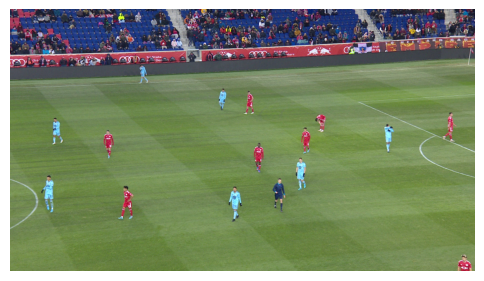

In [19]:
show('/kaggle/input/football-player-segmentation/images/3.jpg',sz=6)

In [21]:
# создаем DataFrame из словаря
df = pd.DataFrame.from_dict(big_dict).iloc[:,:4]
df.head(5)

,id,width,height,file_name
0,1,1920,1080,0.jpg
1,2,1920,1080,1.jpg
2,3,1920,1080,10.jpg
3,4,1920,1080,100.jpg
4,5,1920,1080,101.jpg


In [22]:
df.shape

(512, 4)

In [23]:
# все картинки одинакового размера
df.width.unique(), df.height.unique()

(array([1920]), array([1080]))

In [25]:
pics.sort()

In [26]:
df['way_pics'] = pd.Series(pics)
df.head(4)

,id,width,height,file_name,way_pics
0,1,1920,1080,0.jpg,/kaggle/input/football-player-segmentation/ima...
1,2,1920,1080,1.jpg,/kaggle/input/football-player-segmentation/ima...
2,3,1920,1080,10.jpg,/kaggle/input/football-player-segmentation/ima...
3,4,1920,1080,100.jpg,/kaggle/input/football-player-segmentation/ima...


In [27]:
df = df.iloc[1:,:] # удаляем строку с именем имено 0

In [29]:
df.reset_index(drop = True, inplace = True) # сбрасываем индекс на месте, удаляя старые

In [30]:
df

,id,width,height,file_name,way_pics
0,2,1920,1080,1.jpg,/kaggle/input/football-player-segmentation/ima...
1,3,1920,1080,10.jpg,/kaggle/input/football-player-segmentation/ima...
2,4,1920,1080,100.jpg,/kaggle/input/football-player-segmentation/ima...
3,5,1920,1080,101.jpg,/kaggle/input/football-player-segmentation/ima...
4,6,1920,1080,102.jpg,/kaggle/input/football-player-segmentation/ima...
...,...,...,...,...,...
506,508,1920,1080,95.jpg,/kaggle/input/football-player-segmentation/ima...
507,509,1920,1080,96.jpg,/kaggle/input/football-player-segmentation/ima...
508,510,1920,1080,97.jpg,/kaggle/input/football-player-segmentation/ima...
509,511,1920,1080,98.jpg,/kaggle/input/football-player-segmentation/ima...


In [32]:
# сравниваем построчно название картинки в столбце file_name и
# название картинки в столбце пути к файлу
print(list(df.file_name) == [i.split('/')[-1] for i in df.way_pics])

True


In [33]:
len(set(stems(list(df.file_name))).intersection(set(stems(list(df.way_pics)))))

511

# **2. Вытаскиваем маски**

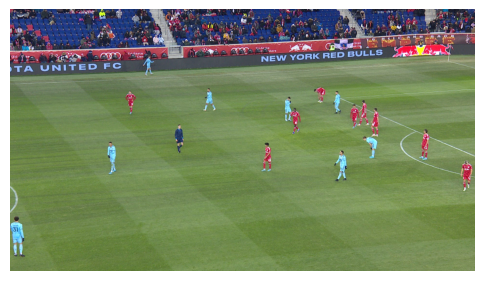

In [34]:
show(df.way_pics[0],sz=6)

In [28]:
df.head(2)

,id,width,height,file_name,way_pics
0,2,1920,1080,1.jpg,/kaggle/input/football-player-segmentation/ima...
1,3,1920,1080,10.jpg,/kaggle/input/football-player-segmentation/ima...


In [35]:
image_id = []
category_id = []
segmentation = []
bboxes = []
for i in df.id:
    for j in data['annotations']:
#         print(j)
        if i == j['image_id']:
            image_id.append(j['image_id']) # индекс картинки
            category_id.append(j['category_id']) # классы
            # ---------------------------------------------------------------------------------------------------
            # здесь вытаскиваем маски и передаем в массив array со значениями 0 и 1
            mask = Image.new('1', (1920, 1080)) # создайте новое изображение в формате (1920, 1080), заполненное черным цветом (по умолчанию)
            mask_draw = ImageDraw.Draw(mask, '1') # таким образом, мы можем нарисовать изображение маски
            mask_draw = mask_draw.polygon(j['segmentation'][0], fill=1)
            segmentation.append(np.array(mask,dtype = np.uint8)) # нарисуйте игрока в белом
#             show(segmentation[-1],sz=8)
            # на выходе список масок для конкретной картинки
            # ---------------------------------------------------------------------------------------------------
#             bboxes.append([int(_) for _ in j['bbox']])
            bboxes.append([int(i) for i in 
                    [(j['bbox'][0]),
                    (j['bbox'][1]),
                    (j['bbox'][0]+j['bbox'][2]),
                    (j['bbox'][1]+j['bbox'][-1])]])#[::-1]) # список коробок 
    break

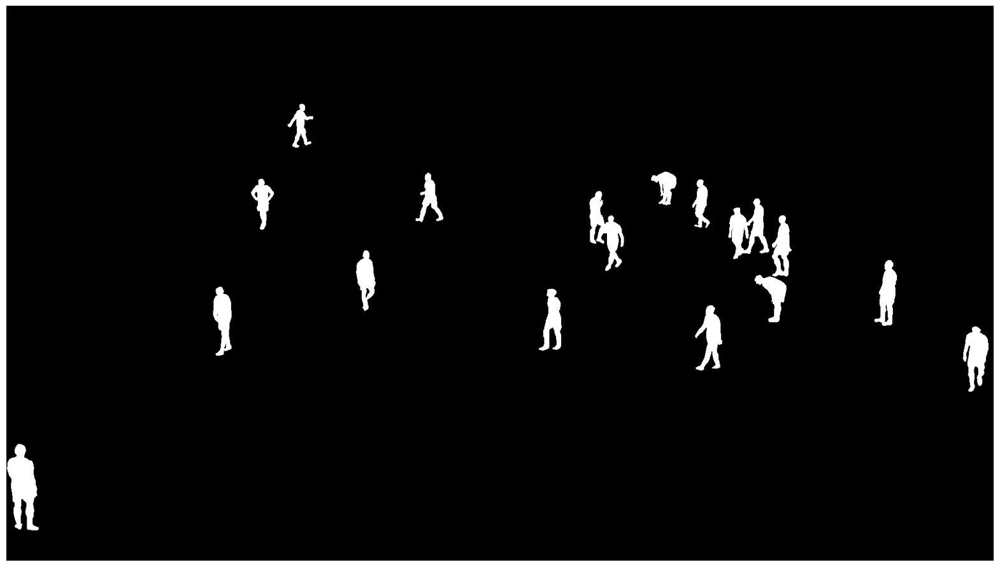

In [36]:
# соединяем все маски в одну, для всех футболистов делаем 1, для фона остается 0
for i in segmentation[1:]:
    segmentation[0] += i
segmentation[0][segmentation[0] > 0] = 1
masks = segmentation[0]
show(masks)

(([], []), ([], []))

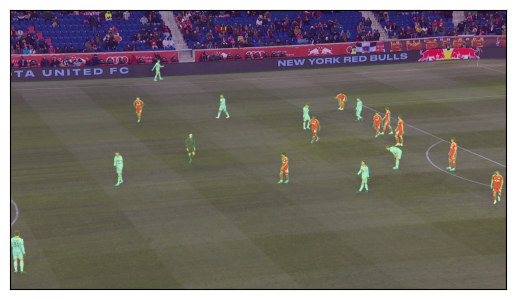

In [37]:
plt.imshow(read(df.way_pics[0]))
plt.imshow(masks,alpha=0.3)
plt.xticks([]), plt.yticks([])

In [32]:
# bboxes

[[1428, 375, 1483, 482],
 [1254, 323, 1302, 387],
 [1035, 551, 1079, 670],
 [476, 337, 520, 435],
 [547, 191, 596, 275],
 [1, 852, 62, 1020],
 [1155, 408, 1200, 515],
 [1334, 338, 1367, 432],
 [1404, 393, 1443, 492],
 [1134, 360, 1162, 462],
 [1339, 583, 1391, 709],
 [1688, 495, 1731, 622],
 [1860, 624, 1909, 751],
 [680, 476, 717, 593],
 [796, 325, 849, 420],
 [1455, 524, 1516, 615],
 [402, 547, 437, 680],
 [1489, 408, 1526, 526]]

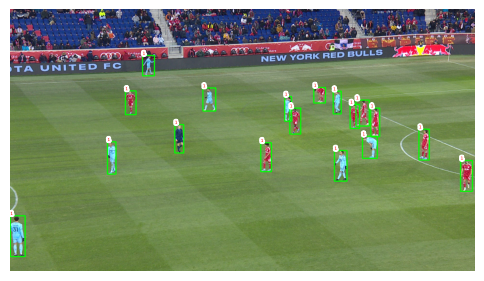

In [38]:
show(df.way_pics[0], bbs = bboxes, texts=category_id, sz=6)

In [34]:
# image_id

[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

# **3. Аугментация**

In [39]:
def get_transform(train):
    image_transforms = []
    image_transforms.append(T.PILToTensor())
    image_transforms.append(T.ConvertImageDtype(torch.float))
    if train:
        image_transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(image_transforms)

# **4. Определяем функцию для подачи данных в DataLoader**

In [36]:
df.way_pics[0]

'/kaggle/input/football-player-segmentation/images/1.jpg'

In [37]:
# df = df
# anns_dict = data['annotations']
# transforms = transforms

══════════════════════════════════════════════════════════════════
tensor([[[0.2196, 0.1882, 0.1490,  ..., 0.6078, 0.6627, 0.6039],
         [0.2275, 0.1843, 0.1490,  ..., 0.5647, 0.6235, 0.5882],
         [0.2471, 0.1961, 0.1569,  ..., 0.4824, 0.5569, 0.5686],
         ...,
         [0.4157, 0.4078, 0.3961,  ..., 0.4235, 0.4078, 0.4000],
         [0.4039, 0.4039, 0.4078,  ..., 0.4275, 0.4196, 0.4157],
         [0.4000, 0.4039, 0.4078,  ..., 0.4314, 0.4314, 0.4314]],

        [[0.2118, 0.1922, 0.1765,  ..., 0.4118, 0.4196, 0.3373],
         [0.2196, 0.1882, 0.1686,  ..., 0.3843, 0.4157, 0.3647],
         [0.2314, 0.1882, 0.1686,  ..., 0.3294, 0.4157, 0.4275],
         ...,
         [0.5137, 0.5059, 0.4980,  ..., 0.5255, 0.5098, 0.5020],
         [0.5059, 0.5059, 0.5098,  ..., 0.5373, 0.5333, 0.5294],
         [0.5020, 0.5059, 0.5098,  ..., 0.5412, 0.5451, 0.5451]],

        [[0.2941, 0.2706, 0.2510,  ..., 0.4588, 0.4706, 0.3882],
         [0.3020, 0.2706, 0.2431,  ..., 0.4235, 0.4549, 

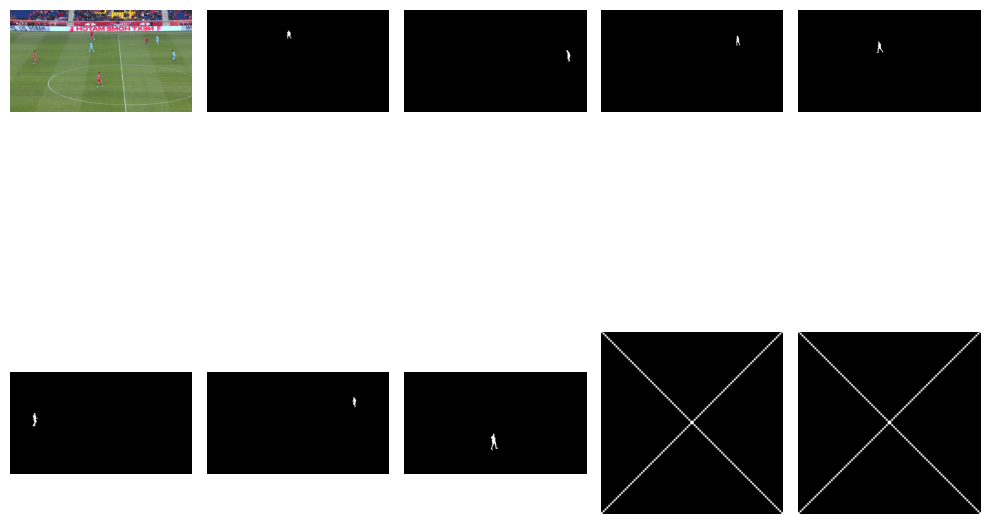

In [40]:
class PlayerDatast(Dataset):
    def __init__(self, df, anns_dict, transforms):
        self.df = df
        self.anns_dict = anns_dict
        self.transforms = transforms
    def get_mask(self,data_anns): # data_anns == data['annotations'] короче список словарей с анн для конкретной картинки типа
        masks = []
        labels = []  
        for i in data_anns:
            labels.append(i['category_id']) # классы
            # ---------------------------------------------------------------------------------------------------
            # здесь вытаскиваем маски и передаем в массив array со значениями 0 и 1
            mask = Image.new('1', (1920, 1080)) # создайте новое изображение в формате (1920, 1080), заполненное черным цветом (по умолчанию)
            mask_draw = ImageDraw.Draw(mask, '1') # таким образом, мы можем нарисовать изображение маски
            mask_draw = mask_draw.polygon(i['segmentation'][0], fill=1)
            masks.append(np.array(mask,dtype = np.uint8)) # нарисуйте игрока в белом
            # на выходе список масок для конкретной картинки
            # ---------------------------------------------------------------------------------------------------
        return np.array(masks), np.array(labels)
    def __getitem__(self, ix):
        img_path = self.df.way_pics[ix]
        ims_id = self.df.id[ix]
        lst_masks = []
        boxes = []
        for i in self.anns_dict:
    #         print(j)
            if i['image_id'] == ims_id:
                lst_masks.append(i)
                lst_boxes = [int(_) for _ in 
                                [(i['bbox'][0]),
                                (i['bbox'][1]),
                                (i['bbox'][0]+i['bbox'][2]),
                                (i['bbox'][1]+i['bbox'][-1])]]
#                 if (((lst_boxes[2]-lst_boxes[0])<=10) | (lst_boxes[-1]-lst_boxes[1])<=10):
#                     lst_boxes[2] = lst_boxes[0]+10
#                     lst_boxes[-1] = lst_boxes[1]+10
                boxes.append(lst_boxes)#[::-1]) # список коробок 
        masks, labels = self.get_mask(lst_masks)
        obj_ids = np.arange(1, len(masks)+1)
        img = Image.open(img_path).convert("RGB")
        num_objs = len(obj_ids)
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)
#         print(boxes)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([ims_id])
#         print(image_id)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
            img, target = self.transforms(img, target)
        if (img.dtype == torch.float32) or (img.dtype == torch.uint8):
            img = img#/255.
        return img, target
    def __len__(self):
        return len(list(self.df.way_pics))
    def choose(self):
        return self[randint(len(self))]
x = PlayerDatast(df, data['annotations'], get_transform(train=True))
im,targ = x[7]
inspect(im,targ)
subplots([im, *targ['masks']], sz=10)
# классы имеют форму tensor([4, 6])
# маски имеют форму torch.Size([2, 720, 1280]), тип данных torch.uint8, т.е. здесь 2 класса,
# которые имеют значения 0 - остальное b 1 - это определяемый класс в маске



In [41]:
for i in x:
    print(i)
    h = i[0]
    bb = i[1]['boxes']
    lb = i[1]['labels']
    print(lb)
    break

(tensor([[[0.6471, 0.6431, 0.6706,  ..., 0.7176, 0.5294, 0.2824],
         [0.6549, 0.6392, 0.6549,  ..., 0.5961, 0.4118, 0.2353],
         [0.6627, 0.6353, 0.6392,  ..., 0.3529, 0.2039, 0.1490],
         ...,
         [0.4431, 0.4314, 0.4353,  ..., 0.5176, 0.5137, 0.5059],
         [0.4157, 0.4157, 0.4275,  ..., 0.5137, 0.5059, 0.4941],
         [0.3961, 0.4118, 0.4235,  ..., 0.5137, 0.5020, 0.4863]],

        [[0.2275, 0.2118, 0.2275,  ..., 0.7137, 0.5490, 0.3176],
         [0.2353, 0.2118, 0.2157,  ..., 0.5922, 0.4392, 0.2745],
         [0.2471, 0.2157, 0.2118,  ..., 0.3490, 0.2314, 0.2039],
         ...,
         [0.5255, 0.5255, 0.5176,  ..., 0.5882, 0.5843, 0.5765],
         [0.4902, 0.4980, 0.5020,  ..., 0.5804, 0.5725, 0.5608],
         [0.4706, 0.4863, 0.4980,  ..., 0.5804, 0.5686, 0.5529]],

        [[0.3451, 0.3490, 0.3961,  ..., 0.7059, 0.5647, 0.3373],
         [0.3451, 0.3373, 0.3725,  ..., 0.6118, 0.4784, 0.3216],
         [0.3373, 0.3176, 0.3373,  ..., 0.4118, 0.3333, 0

In [42]:
b = np.array(bb, dtype=int)#.tolist()
b

array([[1428,  375, 1483,  482],
       [1254,  323, 1302,  387],
       [1035,  551, 1079,  670],
       [ 476,  337,  520,  435],
       [ 547,  191,  596,  275],
       [   1,  852,   62, 1020],
       [1155,  408, 1200,  515],
       [1334,  338, 1367,  432],
       [1404,  393, 1443,  492],
       [1134,  360, 1162,  462],
       [1339,  583, 1391,  709],
       [1688,  495, 1731,  622],
       [1860,  624, 1909,  751],
       [ 680,  476,  717,  593],
       [ 796,  325,  849,  420],
       [1455,  524, 1516,  615],
       [ 402,  547,  437,  680],
       [1489,  408, 1526,  526]])

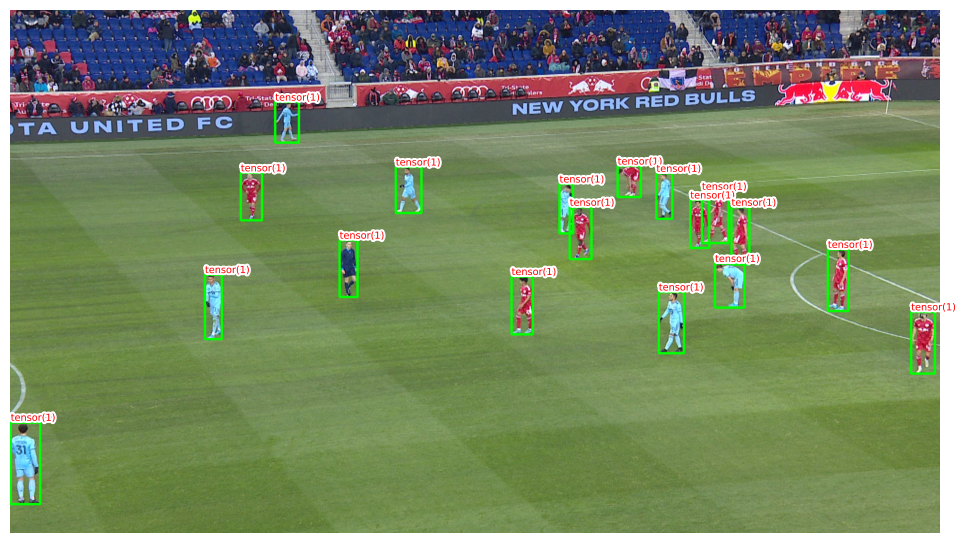

In [43]:
show(df.way_pics[0], bbs = b, texts=list(lb), sz=12)

# **5. train_test_split**

In [44]:
df.sample(2)

,id,width,height,file_name,way_pics
466,468,1920,1080,58.jpg,/kaggle/input/football-player-segmentation/ima...
199,201,1920,1080,287.jpg,/kaggle/input/football-player-segmentation/ima...


In [45]:
# Разбивка данных на основе столбца с именами картинок в df
from sklearn.model_selection import train_test_split
trn_ids, val_ids = train_test_split(df.id.unique(), test_size=0.1, random_state=99)
# типа разбивка df на train_df и val_df на основе разбивки train_test_split
trn_df, val_df = df[df['id'].isin(trn_ids)], df[df['id'].isin(val_ids)]
#print(trn_df, val_df)
len(trn_df), len(val_df)

(459, 52)

In [56]:
trn_df.reset_index(drop = True, inplace = True) # сбрасываем индекс на месте, удаляя старые
val_df.reset_index(drop = True, inplace = True) # сбрасываем индекс на месте, удаляя старые

# **6. Datast  и Dataloader**

In [57]:
dataset = PlayerDatast(trn_df, data['annotations'], get_transform(train=True))
dataset_test = PlayerDatast(val_df, data['annotations'], get_transform(train=False))

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=8, shuffle=True, num_workers=0,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=4, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)

# **7. Параметры обучения и модель**

In [48]:
def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights=True)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,num_classes)
    return model

In [49]:
model = get_model_instance_segmentation(8).to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:01<00:00, 143MB/s]  


In [44]:
# df, data['annotations'], get_transform(train=True)

In [52]:
num_classes = len(classes_list)+1
model = get_model_instance_segmentation(num_classes).to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)
# and a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                step_size=3,
                                                gamma=0.1)

In [53]:
model.eval()
pred = model(dataset[0][0][None].to(device))
inspect(pred[0])

══════════════════════════════════════════════════════════════════
dict of 4 items
tensor([[1.2698e+03, 3.3474e+02, 1.2984e+03, 3.8395e+02],
        [1.8659e+03, 6.6501e+02, 1.8915e+03, 7.5018e+02],
        [1.8715e+03, 6.8274e+02, 1.8974e+03, 7.3946e+02],
        [4.4485e+02, 1.3877e+02, 4.6656e+02, 1.5912e+02],
        [4.8388e+02, 3.4136e+02, 5.1312e+02, 4.3434e+02],
        [1.3649e+03, 6.2773e+02, 1.3922e+03, 6.7029e+02],
        [1.1324e+03, 3.9860e+02, 1.1639e+03, 4.6941e+02],
        [6.8867e+02, 4.7010e+02, 7.3477e+02, 6.0322e+02],
        [1.7030e+03, 4.9617e+02, 1.7469e+03, 6.2138e+02],
        [1.4070e+03, 3.9863e+02, 1.4400e+03, 4.9330e+02],
        [4.0657e+02, 9.6713e+01, 4.3476e+02, 1.2076e+02],
        [1.3560e+03, 6.0822e+02, 1.3888e+03, 6.9611e+02],
        [1.8596e+03, 6.3098e+02, 1.8936e+03, 7.3431e+02],
        [1.8819e+03, 6.2123e+02, 1.9179e+03, 7.5138e+02],
        [1.8712e+01, 8.6313e+02, 7.1957e+01, 1.0150e+03],
        [1.4408e+03, 5.2862e+02, 1.5111e+03, 6.

# **7. Обучение**

In [58]:
num_epochs = 5

trn_history = []
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    res = train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    trn_history.append(res)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    res = evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/58]  eta: 0:03:17  lr: 0.000002  loss: 3.1713 (3.1713)  loss_classifier: 0.5724 (0.5724)  loss_box_reg: 0.8268 (0.8268)  loss_mask: 1.6164 (1.6164)  loss_objectness: 0.1397 (0.1397)  loss_rpn_box_reg: 0.0160 (0.0160)  time: 3.4073  data: 0.6339  max mem: 13112
Epoch: [0]  [10/58]  eta: 0:02:38  lr: 0.000018  loss: 3.1713 (3.1448)  loss_classifier: 0.5763 (0.5761)  loss_box_reg: 0.8252 (0.8255)  loss_mask: 1.5332 (1.4911)  loss_objectness: 0.1438 (0.1499)  loss_rpn_box_reg: 0.1115 (0.1022)  time: 3.2940  data: 0.5314  max mem: 13112
Epoch: [0]  [20/58]  eta: 0:02:06  lr: 0.000034  loss: 2.9400 (2.8766)  loss_classifier: 0.5619 (0.5582)  loss_box_reg: 0.8238 (0.8211)  loss_mask: 1.1904 (1.1777)  loss_objectness: 0.1438 (0.1951)  loss_rpn_box_reg: 0.1196 (0.1246)  time: 3.3289  data: 0.5181  max mem: 13112
Epoch: [0]  [30/58]  eta: 0:01:33  lr: 0.000050  loss: 2.1358 (2.5750)  loss_classifier: 0.5014 (0.5292)  loss_box_reg: 0.8026 (0.8114)  loss_mask: 0.5220 (0.9404)  loss

In [50]:
# %load /kaggle/working/coco_eval.py
# %%writefile /kaggle/working/coco_eval.py

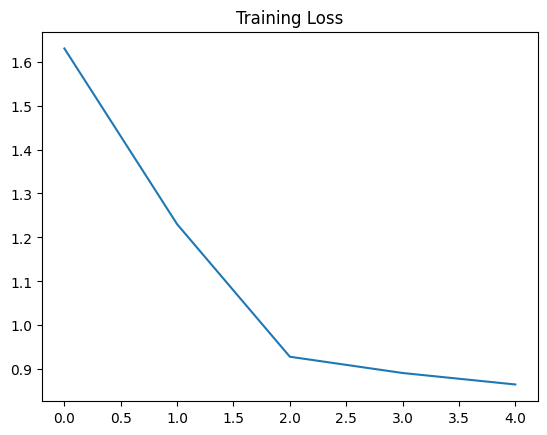

In [60]:
import matplotlib.pyplot as plt
plt.title('Training Loss')
losses = [np.mean(list(trn_history[i].meters['loss'].deque)) for i in range(len(trn_history))]
plt.plot(losses)

In [61]:
losses

[1.6298866808414458,
 1.2301172256469726,
 0.9285191804170608,
 0.8915136188268662,
 0.8653927832841873]

# **15. Сохраняем/загружаем модель**

In [53]:
# save_path = 'Mask_R-CNN(_эпох).pth'
# torch.save(model.state_dict(), save_path)
# !du -hsc {save_path} # size of the model on disk

In [54]:
# load_path = '/content/Mask_R-CNN(_эпох).pth'
# # model.load_state_dict(torch.load(load_path)) #  # строка при загрузке на GРU
# model.load_state_dict(torch.load(load_path, map_location=torch.device('cpu'))) # строка при загрузке на СРU

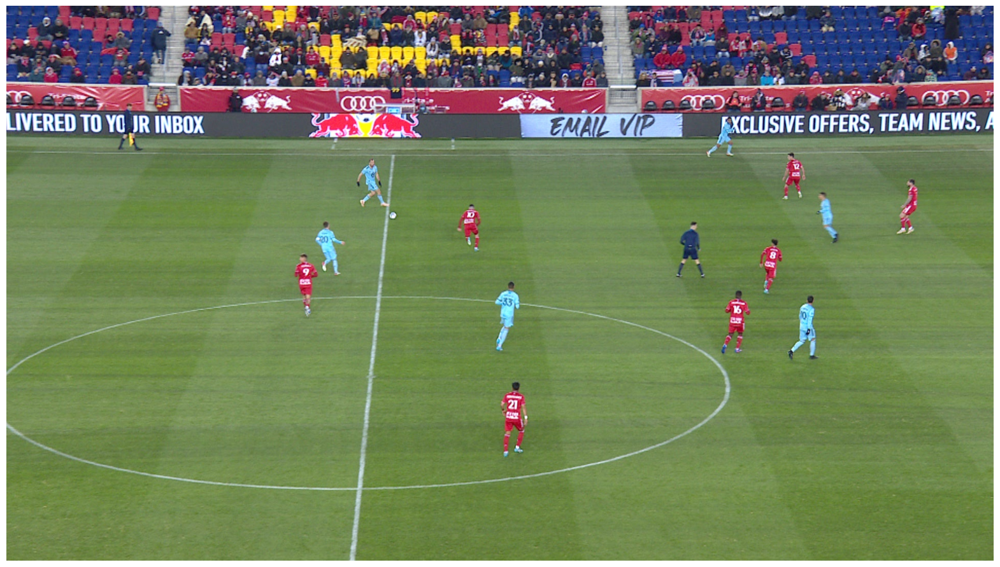

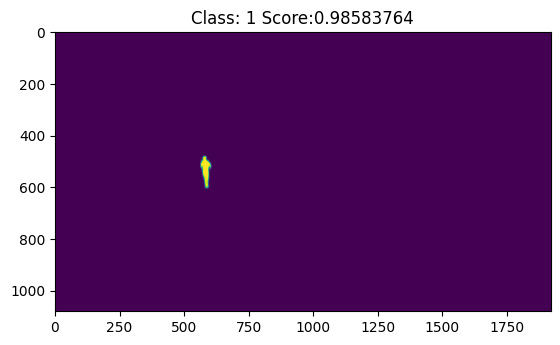

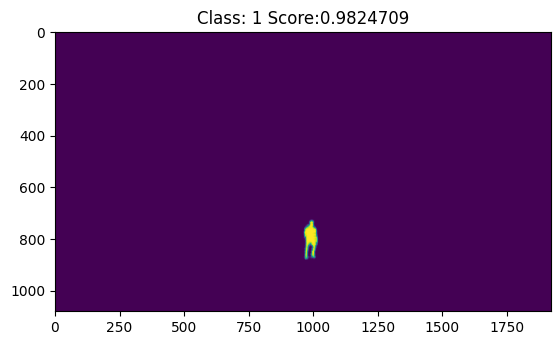

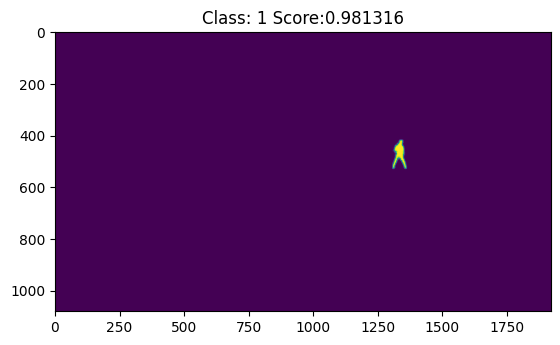

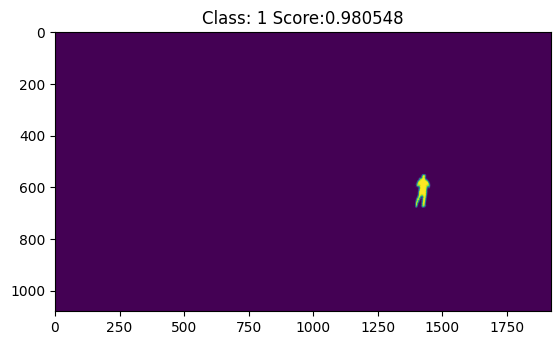

...

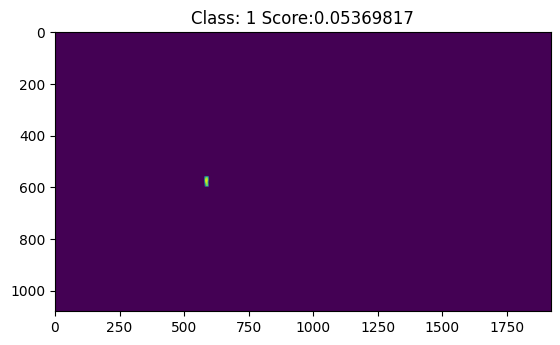

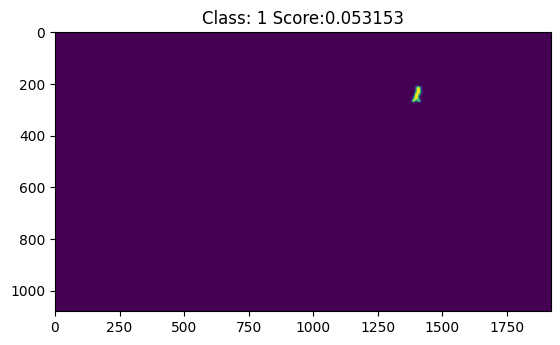

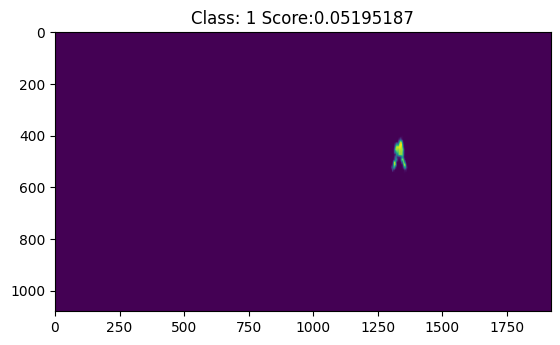

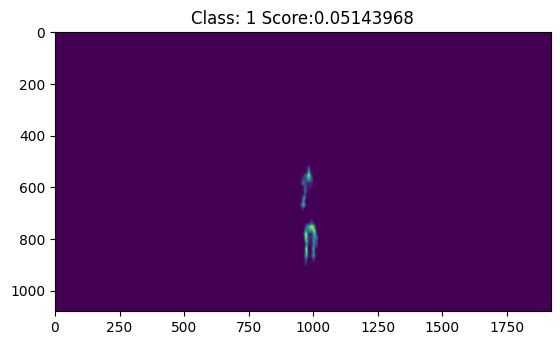

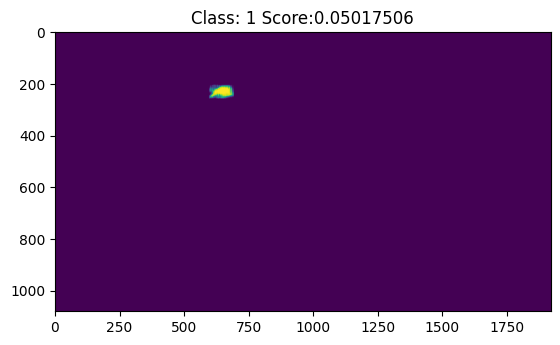

In [62]:
model.eval()
im = dataset_test[12][0]
show(im)
with torch.no_grad():
    prediction = model([im.to(device)])
    for i in range(len(prediction[0]['masks'])):
        plt.imshow(Image.fromarray(prediction[0]['masks'][i, 0].mul(255).byte().cpu().numpy()))
        plt.title('Class: '+str(prediction[0]['labels'][i].cpu().numpy())+' Score:'+str(prediction[0]['scores'][i].cpu().numpy()))
        plt.show()

# **Делаем предсказания на любой картинке:**

# **1. Загружаем картинку:**

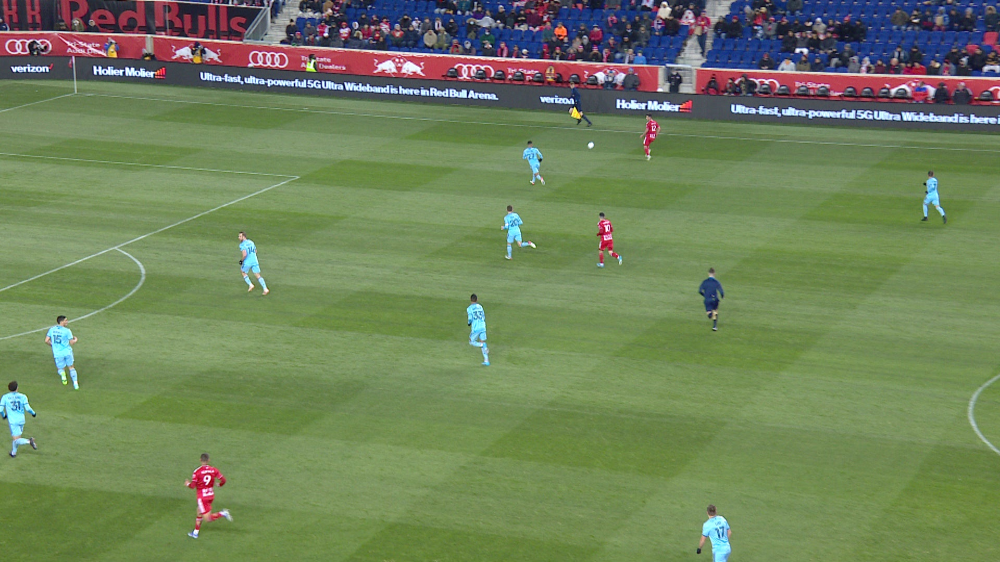

In [63]:
img = Image.open('/kaggle/input/football-player-segmentation/images/11.jpg').convert("RGB")
from torchvision import transforms
pil_to_tensor = transforms.ToTensor()(img).unsqueeze_(0)
Image.fromarray(pil_to_tensor[0].mul(255).permute(1, 2, 0).byte().numpy())

In [65]:
targets2label = {0 : 'фон', 1 : 'чел'}

In [67]:
cl

NameError: name 'cl' is not defined

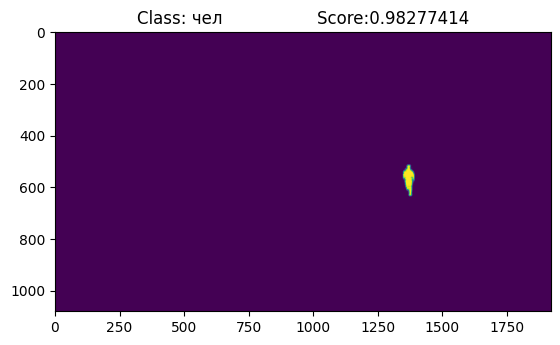

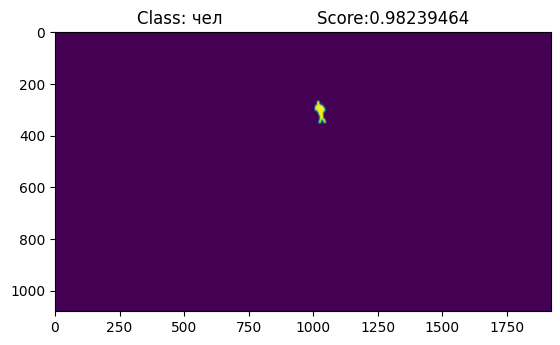

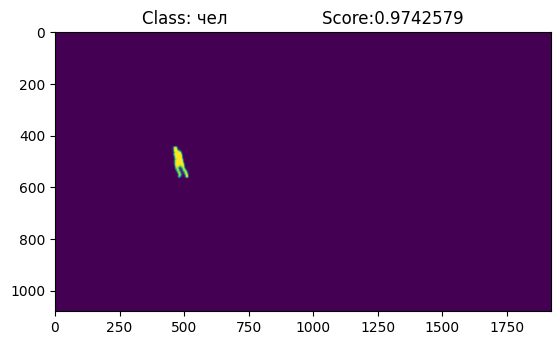

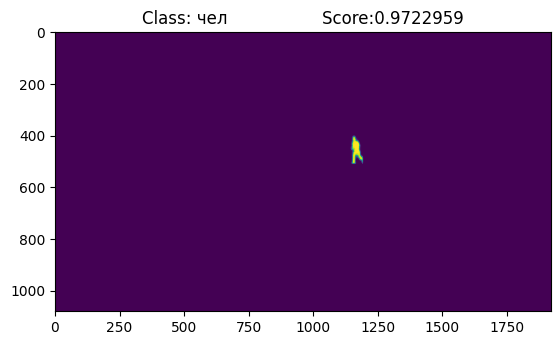

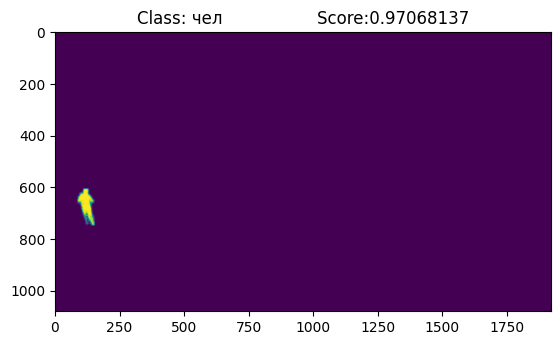

...

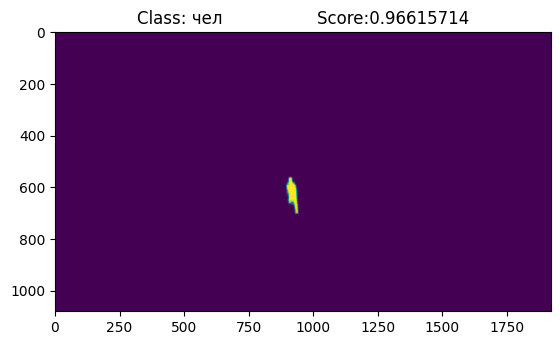

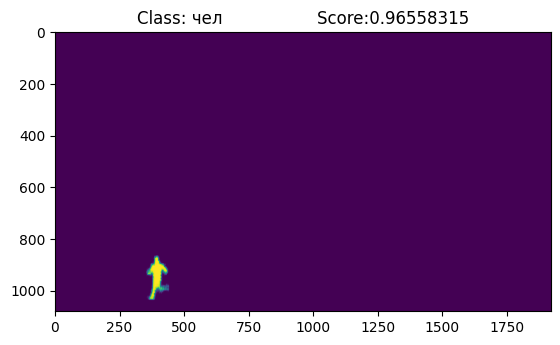

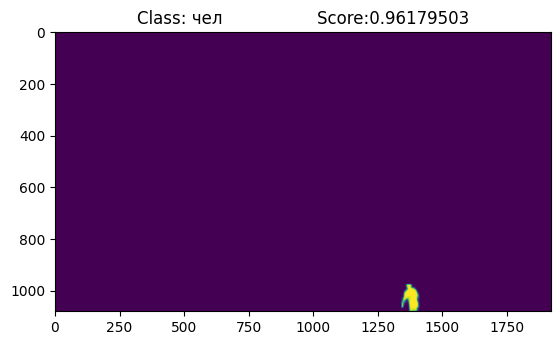

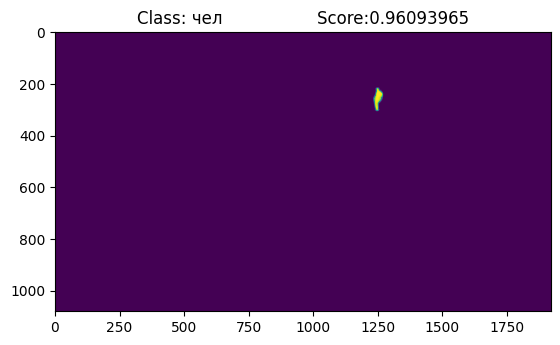

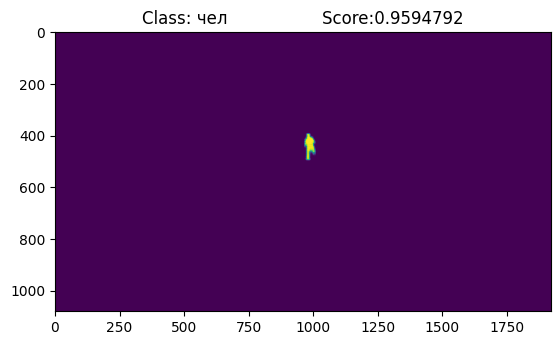

In [68]:
cl = []
bbxes = []
mask = []
model.eval()
with torch.no_grad():
  prediction = model([pil_to_tensor[0].to(device)])
  for i in range(len(prediction[0]['masks'])):
    if prediction[0]['scores'][i] > 0.6:
        mask.append(Image.fromarray(prediction[0]['masks']\
                  [i, 0].mul(255).byte().cpu().numpy()))
        plt.imshow(Image.fromarray(prediction[0]['masks']\
                  [i, 0].mul(255).byte().cpu().numpy()))
        plt.title('Class: '+targets2label[int(prediction[0]['labels'][i].cpu().numpy())]+'\
                  Score:'+str(prediction[0]['scores'][i].cpu().numpy()))
        plt.show()
        bbxes.append(list(prediction[0]['boxes'][i].cpu().numpy()))
        cl.append(targets2label[int(prediction[0]['labels'][i].cpu())])

In [103]:
# read(mask[0])+read(mask[1])

[ WARN:0@3513.376] global loadsave.cpp:241 findDecoder imread_('<PIL.Image.Image image mode=L size=1920x1080 at 0x79811124E500>'): can't open/read file: check file path/integrity


TypeError: 'NoneType' object is not subscriptable

TypeError: Invalid shape (13, 1, 1080, 1920) for image data

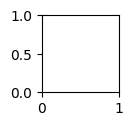

In [72]:
# # соединяем все маски в одну, для всех футболистов делаем 1, для фона остается 0
# for i in mask:
#     mask[0] += i
# mask[0][mask[0] > 0] = 1
# masks = mask[0]
# show(masks)

# **3. Выводим bboxes с помощью torchsnippets:**

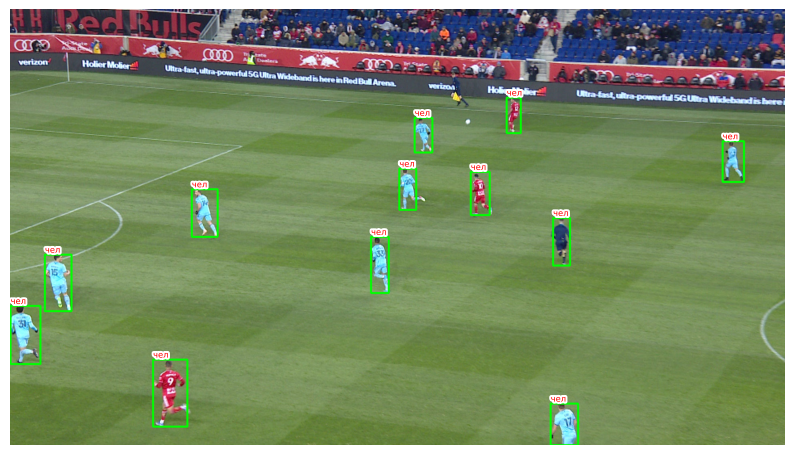

In [74]:
im = '/kaggle/input/football-player-segmentation/images/11.jpg'
bbs = torch.Tensor(bbxes)#prediction[0]['boxes'][:2]
clss = cl#prediction[0]['labels'][:2]

show(im, bbs=bbs, texts=clss, sz=10)

# **4. Выводим bboxes без использования torchsnippets:**

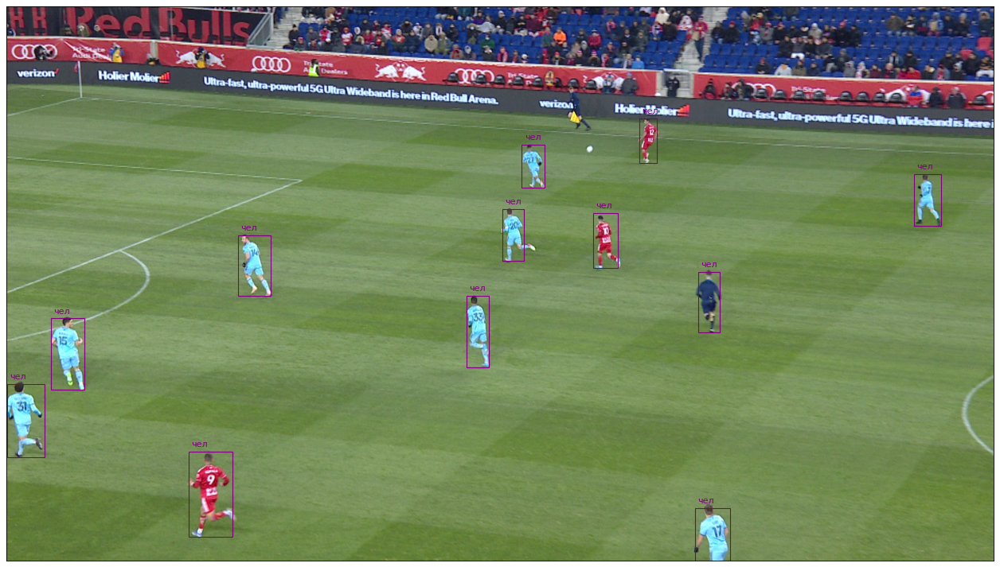

In [75]:
import matplotlib.patches as patches
#-------------------------------
# переводим картинку в цифру
im = Image.open('/kaggle/input/football-player-segmentation/images/11.jpg')
im = im.convert('RGB')
im = np.asarray(im)#.transpose(-1,0,1)/255
#-------------------------------
plt.figure(figsize=(20,20), dpi=80)
plt.imshow(im)
#-------------------------------
#объединяем коробки и классы
lst = list(zip(bbxes,cl))
for _ in lst:
    bbox = _[0]
    label = _[1]#.item()
    rect = patches.Rectangle(xy=(int(bbox[0]), int(bbox[1])), width=int(bbox[2]-bbox[0]),
                             height=int(bbox[3]-bbox[1]), fill=False, gid = label, color = 'purple')#, facecolor = 'pink')#, edgecolor=color, linewidth=2)
    plt.gca().add_patch(rect)
    plt.text(int(bbox[0]+5), int(bbox[1]-10), label, color = 'purple')
plt.xticks([]), plt.yticks([])
plt.show()